CONNECTION TO DATABASE 

In [ ]:
from sqlalchemy import create_engine,text
from dotenv import load_dotenv
import os

# Load environment variables from .env file
load_dotenv()

# Get DB credentials from environment
db_user = os.getenv("DB_USER")
db_password = os.getenv("DB_PASSWORD")
db_host = os.getenv("DB_HOST")
db_name = os.getenv("DB_NAME")
db_port = os.getenv("DB_PORT")

# Construct the SQLAlchemy database URL
DATABASE_URL = f"postgresql://{db_user}:{db_password}@{db_host}:{db_port}/{db_name}"

try:
    # Create SQLAlchemy engine
    engine = create_engine(DATABASE_URL, isolation_level="AUTOCOMMIT")
    connection = engine.connect()
    print("Database connection successful!")
except Exception as e:
    print("Database connection failed.")
    print(e)


Database connection successful!


IMPORTS AND DISPLAY 

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import folium
import time 

# Pandas display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 500)


DATASET VISUALIZATION 

CITY SUBZONE MAPPING 

In [ ]:
# -----------------------------
# Step 1: Load and Clean City-Subzone Data
# -----------------------------
query = """SELECT subzone, city FROM region"""
c_df = pd.read_sql(query, connection)

# Standardize city and subzone names
c_df['city'] = c_df['city'].str.strip().str.title()
c_df['subzone'] = c_df['subzone'].str.strip().str.title()

# Remove rows where city or subzone is null or empty
c_df = c_df.dropna(subset=['city', 'subzone'])
c_df = c_df[(c_df['city'] != '') & (c_df['subzone'] != '')]

# Drop duplicate (city, subzone) pairs
c_df = c_df.drop_duplicates()

# Group subzones under each city
city_df = c_df.groupby('city')['subzone'].apply(list).reset_index()
city_df = city_df.explode('subzone').reset_index(drop=True)


C:\Users\rijul\AppData\Local\Temp\ipykernel_14968\3608415565.py:5: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  c_df = pd.read_sql(query, conn)


In [5]:
# -----------------------------
# Step 1: Normalize city and subzone
# -----------------------------
def normalize_subzone(text):
    return text.lower().replace('-', ' ').strip()

city_df['city'] = city_df['city'].str.lower().str.strip()
city_df['subzone'] = city_df['subzone'].apply(normalize_subzone)

# -----------------------------
# Step 2: Geocode Each (Subzone, City)
# -----------------------------
geolocator = Nominatim(user_agent="zone-intelligence")

def geocode_with_fallback(location, fallback_location=None, retries=3):
    for _ in range(retries):
        try:
            result = geolocator.geocode(location, timeout=10)
            if not result and fallback_location:
                result = geolocator.geocode(fallback_location, timeout=10)
            return result
        except GeocoderTimedOut:
            time.sleep(2)
    return None

latitudes = []
longitudes = []

print("Geocoding in progress...")

for subzone, city in zip(city_df['subzone'], city_df['city']):
    full_location = f"{subzone}, {city}, India"
    fallback_location = f"{city}, India"
    result = geocode_with_fallback(full_location, fallback_location)

    if result:
        latitudes.append(result.latitude)
        longitudes.append(result.longitude)
    else:
        latitudes.append(None)
        longitudes.append(None)

    time.sleep(1)  # Respect rate limits

# -----------------------------
# Step 3: Attach Coordinates
# -----------------------------
city_df['latitude'] = latitudes
city_df['longitude'] = longitudes

# -----------------------------
# Step 4: Drop Duplicates and Reset Index
# -----------------------------
city_df = city_df.drop_duplicates(subset=['city', 'subzone', 'latitude', 'longitude']).reset_index(drop=True)

# -----------------------------
# Step 5: Optional - Restore Title Case
# -----------------------------
city_df['city'] = city_df['city'].str.title()
city_df['subzone'] = city_df['subzone'].str.title()

# -----------------------------
# Step 6: Show Missing Geocodes
# -----------------------------
missing = city_df[city_df['latitude'].isna()]
if not missing.empty:
    print("\nFailed to geocode the following entries:")
    print(missing[['city', 'subzone']])

# -----------------------------
# Step 7: Final Output
# -----------------------------
print("\nGeocoding Completed:\n")
city_df


Geocoding in progress...

Geocoding Completed:



,city,subzone,latitude,longitude
0,Agra,Tajganj,27.168716,78.038968
1,Agra,Agra,27.175255,78.009816
2,Agra,Lohamandi,27.189606,77.994904
3,Agra,Bbk Agra Tier 2,27.175255,78.009816
4,Agra,Civil Lines,27.199435,78.005901
5,Ahmedabad,Vastrapur,23.040086,72.529042
6,Ahmedabad,Ghatlodia,23.084852,72.530328
7,Ahmedabad,Thaltej,23.048539,72.511742
8,Ahmedabad,Adalaj,23.021537,72.580057
9,Ahmedabad,Ashram Road,23.024252,72.571303


CITY, SUBZONE AND BRAND MAPPING 

In [6]:
query = """SELECT distinct
    r.city, 
    r.subzone, 
    b.brand_name
FROM 
    region r
JOIN 
    master_ids m ON r.region_id = m.region_id
JOIN 
    brand b ON m.brand_id = b.brand_id
ORDER BY 
    r.city, r.subzone, b.brand_name"""

brand_df = pd.read_sql(query,conn)


# Define the same normalization function
def normalize_subzone(text):
    return text.lower().replace('-', ' ').strip()

# Normalize city and subzone in brand_df
brand_df['city'] = brand_df['city'].str.lower().str.strip()
brand_df['subzone'] = brand_df['subzone'].astype(str).apply(normalize_subzone)

# Title case for display
brand_df['city'] = brand_df['city'].str.title()
brand_df['subzone'] = brand_df['subzone'].str.title()

brand_df


C:\Users\rijul\AppData\Local\Temp\ipykernel_14968\3692458511.py:14: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  brand_df = pd.read_sql(query,conn)


,city,subzone,brand_name
0,Agra,Bbk Agra Tier 2,Biryani By Kilo
1,Agra,Civil Lines,Burgrill
2,Agra,Civil Lines,Goila Butter Chicken
3,Agra,Civil Lines,Krazy Kebab Co
4,Agra,Lohamandi,Burgrill
5,Agra,Tajganj,Bercos
6,Agra,Tajganj,Biryani By Kilo
7,Agra,Tajganj,Delifrance
8,Agra,Tajganj,Goila Butter Chicken
9,Agra,Tajganj,Hatti Kaapi


POS DATA 

In [7]:
query = """
SELECT 
    city, 
    subzone, 
    brand_name, 
    SUM(gross_sales) AS total_gross_sales,
    SUM(order_count) AS total_orders,
    SUM(discount) AS total_discount,
    ROUND(SUM(gross_sales) / NULLIF(SUM(order_count), 0), 2) AS avg_order_value
FROM (
    -- Rista Data
    SELECT 
        r.city, 
        r.subzone, 
        b.brand_name,
        SUM(rr.gross_amount + rr.direct_charge_amount + rr.other_charge_amount + rr.tip) AS gross_sales,
        COUNT(DISTINCT rr.uniq_id) AS order_count,
        SUM(rr.discounts) AS discount
    FROM 
        region r
    JOIN 
        master_ids m ON r.region_id = m.region_id
    JOIN 
        brand b ON m.brand_id = b.brand_id
    JOIN 
        sales_transaction_audit_report_rista rr ON m.pos_id = rr.pos_id
    GROUP BY 
        r.city, r.subzone, b.brand_name

    UNION ALL

    -- Petpooja Data
    SELECT 
        r.city, 
        r.subzone, 
        b.brand_name,
        SUM(p.my_amount + p.delivery_charge + p.container_charge + p.service_charge + p.additional_charge) AS gross_sales,
        COUNT(DISTINCT p.uniq_id) AS order_count,
        SUM(p.discount) AS discount
    FROM 
        region r
    JOIN 
        master_ids m ON r.region_id = m.region_id
    JOIN 
        brand b ON m.brand_id = b.brand_id
    JOIN 
        order_summary_report_petpooja p ON m.pos_id = p.pos_id
    GROUP BY 
        r.city, r.subzone, b.brand_name

    UNION ALL

    -- Urban Piper Data
    SELECT 
        r.city, 
        r.subzone, 
        b.brand_name,
        SUM(u.gross_amount + u.other_charge_amount) AS gross_sales,
        COUNT(DISTINCT u.uniq_id) AS order_count,
        SUM(u.discount) AS discount
    FROM 
        region r
    JOIN 
        master_ids m ON r.region_id = m.region_id
    JOIN 
        brand b ON m.brand_id = b.brand_id
    JOIN 
        urban_piper_sales u ON m.pos_id = u.pos_id
    GROUP BY 
        r.city, r.subzone, b.brand_name
) combined
GROUP BY 
    city, subzone, brand_name
ORDER BY 
    city ASC, subzone ASC, brand_name ASC;
"""


# Execute the query and load results into a DataFrame
sales_df = pd.read_sql(query,conn)

# --- Step 2: Normalize Subzones in sales_df ---
def normalize_subzone(text):
    return text.lower().replace('-', ' ').strip()

sales_df['city'] = sales_df['city'].str.lower().str.strip()
sales_df['subzone'] = sales_df['subzone'].apply(normalize_subzone)

# Optional: Title case for display
sales_df['city'] = sales_df['city'].str.title()
sales_df['subzone'] = sales_df['subzone'].str.title()

# Optional: Set display format
pd.options.display.float_format = '{:.4f}'.format

sales_df

C:\Users\rijul\AppData\Local\Temp\ipykernel_14968\1739477527.py:80: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  sales_df = pd.read_sql(query,conn)


,city,subzone,brand_name,total_gross_sales,total_orders,total_discount,avg_order_value
0,Agra,Bbk Agra Tier 2,Biryani By Kilo,50515.9600,107.0000,8386.5600,472.1100
1,Agra,Civil Lines,Burgrill,159904.8300,399.0000,31801.1600,400.7600
2,Agra,Civil Lines,Goila Butter Chicken,3591431.6900,6149.0000,734255.2000,584.0700
3,Agra,Civil Lines,Krazy Kebab Co,704669.4300,1428.0000,222419.2800,493.4700
4,Agra,Lohamandi,Burgrill,1078607.2300,335.0000,11310.6400,3219.7200
5,Agra,Tajganj,Bercos,4151296.3900,4164.0000,92338.2400,996.9500
6,Agra,Tajganj,Goila Butter Chicken,6742.0000,19.0000,1881.1600,354.8400
7,Agra,Tajganj,Krazy Kebab Co,10265619.6900,33423.0000,3392681.7900,307.1400
8,Agra,Tajganj,Masala Trail by PVR INOX,7262.7600,21.0000,2393.0000,345.8500
9,Agra,Tajganj,not_partner,2858.5400,11.0000,0.0000,259.8700


SWIGGY AND ZOMATO DATA 

In [8]:
# Query execution
query = """
SELECT 
    city, 
    subzone, 
    brand_name, 
    SUM(gross_sales) AS total_gross_sales,
    SUM(order_count) AS total_orders,
    SUM(discount) AS total_discount,
    ROUND(SUM(gross_sales) / NULLIF(SUM(order_count), 0), 2) AS avg_order_value
FROM (
    -- Rating Zomato Data
    SELECT 
        r.city, 
        r.subzone, 
        b.brand_name,
        SUM(rz.bill_subtotal + rz.packaging_charges) AS gross_sales,
        COUNT(DISTINCT rz.order_id) AS order_count,
        SUM(
            rz.restaurant_discount_promo +
            rz.restaurant_discount_flat_offs_freebies_others +
            rz.gold_discount +
            rz.brand_pack_discount
        ) AS discount
    FROM 
        region r
    JOIN 
        master_ids m ON r.region_id = m.region_id
    JOIN 
        brand b ON m.brand_id = b.brand_id
    JOIN 
        rating_zomato rz ON m.res_id = rz.restaurant_id
    WHERE 
        rz.order_status = 'Delivered'
        AND b.brand_id IN ('1008', '1037', '1041', '1042', '1043', '1044', '1045', '1009', '1025', '1024', '1047', '1060', '1048', '1023', '1049', '1050', '1051', '1053', '1054', '1056')
    GROUP BY 
        r.city, r.subzone, b.brand_name

    UNION ALL

    -- Swiggy Order Detail V2 Data
    SELECT 
        r.city, 
        r.subzone, 
        b.brand_name,
        SUM(s.gmv + s.packing_charge) AS gross_sales,
        COUNT(DISTINCT s.order_id) AS order_count,
        SUM(s.coupon_discount) AS discount
    FROM 
        region r
    JOIN 
        master_ids m ON r.region_id = m.region_id
    JOIN 
        brand b ON m.brand_id = b.brand_id
    JOIN 
        swiggy_order_detail_v2 s ON m.res_id = s.res_id
    WHERE 
        s.post_status = 'Completed'
        AND b.brand_id IN ('1008', '1037', '1041', '1042', '1043', '1044', '1045', '1009', '1025', '1024', '1047', '1060', '1048', '1023', '1049', '1050', '1051', '1053', '1054', '1056')
    GROUP BY 
        r.city, r.subzone, b.brand_name
) combined
GROUP BY 
    city, subzone, brand_name
ORDER BY 
    city ASC, subzone ASC, brand_name ASC;
"""

# Execute query and fetch results
sz_sales_df = pd.read_sql(query, conn)
def normalize_subzone(text):
    return text.lower().replace('-', ' ').strip()

# Step 2: Normalize 'city' and 'subzone' columns
sz_sales_df['city'] = sz_sales_df['city'].str.lower().str.strip()
sz_sales_df['subzone'] = sz_sales_df['subzone'].astype(str).apply(normalize_subzone)

# Step 3: Drop exact duplicates
sz_sales_df = sz_sales_df.drop_duplicates(subset=['city', 'subzone', 'brand_name'])

# Step 4: Optional - Title case for display
sz_sales_df['city'] = sz_sales_df['city'].str.title()
sz_sales_df['subzone'] = sz_sales_df['subzone'].str.title()

# Show final cleaned DataFrame
sz_sales_df

C:\Users\rijul\AppData\Local\Temp\ipykernel_14968\3029105437.py:70: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  sz_sales_df = pd.read_sql(query, conn)


,city,subzone,brand_name,total_gross_sales,total_orders,total_discount,avg_order_value
0,Agra,Tajganj,Delifrance,50527.3998,48.0000,3775.3800,1052.6500
1,Agra,Tajganj,Hatti Kaapi,2453.4160,8.0000,727.5500,306.6800
2,Agra,Tajganj,Mad Over Donuts,509837.4775,810.0000,74956.6100,629.4300
3,Ahmedabad,Chandkheda,Mad Over Donuts,847705.3917,1581.0000,194717.3100,536.1800
4,Ahmedabad,Ghatlodia,Mad Over Donuts,1001863.9010,1746.0000,207141.8000,573.8100
5,Ahmedabad,Navrangpura,Mad Over Donuts,650106.0700,1169.0000,151203.3500,556.1200
6,Ahmedabad,Prahlad Nagar,Mad Over Donuts,834800.4300,1416.0000,183299.9300,589.5500
7,Ahmedabad,Vastrapur,Mad Over Donuts,949798.7730,1657.0000,193240.9800,573.2000
8,Bangalore,Arekere,Mad Over Donuts,2020439.0665,3499.0000,409344.7300,577.4300
9,Bangalore,Basavanagudi,Mad Over Donuts,1616688.6688,2873.0000,360973.1300,562.7200


COMBINED DATA 

In [9]:
# Combine the two dataframes
combined_df = pd.concat([sales_df, sz_sales_df], ignore_index=True)
pd.options.display.float_format = '{:.2f}'.format

# Group by city, subzone, brand_name and aggregate metrics
final_df = combined_df.groupby(['city', 'subzone', 'brand_name'], as_index=False).agg({
    'total_gross_sales': 'sum',
    'total_orders': 'sum',
    'total_discount': 'sum'
})

# Calculate Average Order Value (AOV)
final_df['avg_order_value'] = final_df['total_gross_sales'] / final_df['total_orders']
final_df


,city,subzone,brand_name,total_gross_sales,total_orders,total_discount,avg_order_value
0,Agra,Bbk Agra Tier 2,Biryani By Kilo,50515.96,107.00,8386.56,472.11
1,Agra,Civil Lines,Burgrill,159904.83,399.00,31801.16,400.76
2,Agra,Civil Lines,Goila Butter Chicken,3591431.69,6149.00,734255.20,584.07
3,Agra,Civil Lines,Krazy Kebab Co,704669.43,1428.00,222419.28,493.47
4,Agra,Lohamandi,Burgrill,1078607.23,335.00,11310.64,3219.72
5,Agra,Tajganj,Bercos,4151296.39,4164.00,92338.24,996.95
6,Agra,Tajganj,Delifrance,50527.40,48.00,3775.38,1052.65
7,Agra,Tajganj,Goila Butter Chicken,6742.00,19.00,1881.16,354.84
8,Agra,Tajganj,Hatti Kaapi,2453.42,8.00,727.55,306.68
9,Agra,Tajganj,Krazy Kebab Co,10265619.69,33423.00,3392681.79,307.14


COMBINED DATA - SUBZONE WISE 

In [10]:
# --- Step 1: Group and aggregate ---
subzone_city_df = final_df.groupby(['city', 'subzone'], as_index=False).agg({
    'total_gross_sales': 'sum',
    'total_orders': 'sum',
    'total_discount': 'sum'
})
subzone_city_df['avg_order_value'] = subzone_city_df['total_gross_sales'] / subzone_city_df['total_orders']

# --- Step 2: Run brand count query ---
brand_count_query = """
SELECT 
    r.city, 
    r.subzone, 
    COUNT(DISTINCT b.brand_name) AS total_brands
FROM 
    region r
JOIN 
    master_ids m ON r.region_id = m.region_id
JOIN 
    brand b ON m.brand_id = b.brand_id
GROUP BY 
    r.city, r.subzone
ORDER BY 
    r.city, r.subzone
"""
brand_count_df = pd.read_sql(brand_count_query, conn)

# --- Step 3: Normalize case & hyphens to match both DataFrames ---
def normalize_text(text):
    return text.lower().replace('-', ' ').strip()

# Normalize city and subzone in both DataFrames
subzone_city_df['city'] = subzone_city_df['city'].apply(normalize_text)
subzone_city_df['subzone'] = subzone_city_df['subzone'].apply(normalize_text)

brand_count_df['city'] = brand_count_df['city'].apply(normalize_text)
brand_count_df['subzone'] = brand_count_df['subzone'].apply(normalize_text)

# Optional: Title-case for better display
subzone_city_df['city'] = subzone_city_df['city'].str.title()
subzone_city_df['subzone'] = subzone_city_df['subzone'].str.title()

brand_count_df['city'] = brand_count_df['city'].str.title()
brand_count_df['subzone'] = brand_count_df['subzone'].str.title()

# --- Step 4: Merge ---
final_display_df = pd.merge(subzone_city_df, brand_count_df, on=['city', 'subzone'], how='left')

# Optional: Display format
pd.options.display.float_format = '{:.4f}'.format
final_display_df


C:\Users\rijul\AppData\Local\Temp\ipykernel_14968\1001711544.py:26: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  brand_count_df = pd.read_sql(brand_count_query, conn)


,city,subzone,total_gross_sales,total_orders,total_discount,avg_order_value,total_brands
0,Agra,Bbk Agra Tier 2,50515.9600,107.0000,8386.5600,472.1118,1
1,Agra,Civil Lines,4456005.9500,7976.0000,988475.6400,558.6768,3
2,Agra,Lohamandi,1078607.2300,335.0000,11310.6400,3219.7231,1
3,Agra,Tajganj,14996597.6733,38504.0000,3568753.7300,389.4816,11
4,Ahmedabad,Bapunagar,146064.6400,385.0000,34927.5700,379.3887,2
5,Ahmedabad,Bodakdev,5093751.4900,17570.0000,97583.5000,289.9119,2
6,Ahmedabad,Chandkheda,1020785.7517,2073.0000,245025.1100,492.4196,2
7,Ahmedabad,Ghatlodia,1299635.3210,2534.0000,288751.6700,512.8790,3
8,Ahmedabad,Memnagar,674.1900,2.0000,0.0000,337.0950,1
9,Ahmedabad,Naranpura,184705.9500,510.0000,54591.9200,362.1685,1


In [11]:
# Step 1: Normalize both DataFrames BEFORE any merge
def normalize(text):
    return text.lower().strip()

# Normalize city_df
city_df['city'] = city_df['city'].apply(normalize)
city_df['subzone'] = city_df['subzone'].apply(normalize)

# Normalize final_display_df
final_display_df['city'] = final_display_df['city'].apply(normalize)
final_display_df['subzone'] = final_display_df['subzone'].apply(normalize)

# Step 2: Drop any existing latitude/longitude columns to prevent merge conflicts
final_display_df = final_display_df.drop(columns=['latitude', 'longitude'], errors='ignore')

# Step 3: Merge coordinates
sales_display_df = pd.merge(
    final_display_df,
    city_df,  # already contains city, subzone, latitude, longitude
    on=['city', 'subzone'],
    how='left'
)

# Step 4 (Optional): Title-case for better readability
sales_display_df['city'] = sales_display_df['city'].str.title()
sales_display_df['subzone'] = sales_display_df['subzone'].str.title()

# Done
sales_display_df


,city,subzone,total_gross_sales,total_orders,total_discount,avg_order_value,total_brands,latitude,longitude
0,Agra,Bbk Agra Tier 2,50515.9600,107.0000,8386.5600,472.1118,1,27.1753,78.0098
1,Agra,Civil Lines,4456005.9500,7976.0000,988475.6400,558.6768,3,27.1994,78.0059
2,Agra,Lohamandi,1078607.2300,335.0000,11310.6400,3219.7231,1,27.1896,77.9949
3,Agra,Tajganj,14996597.6733,38504.0000,3568753.7300,389.4816,11,27.1687,78.0390
4,Ahmedabad,Bapunagar,146064.6400,385.0000,34927.5700,379.3887,2,23.0324,72.6314
5,Ahmedabad,Bodakdev,5093751.4900,17570.0000,97583.5000,289.9119,2,23.0446,72.5173
6,Ahmedabad,Chandkheda,1020785.7517,2073.0000,245025.1100,492.4196,2,23.1101,72.5811
7,Ahmedabad,Ghatlodia,1299635.3210,2534.0000,288751.6700,512.8790,3,23.0849,72.5303
8,Ahmedabad,Memnagar,674.1900,2.0000,0.0000,337.0950,1,23.0531,72.5329
9,Ahmedabad,Naranpura,184705.9500,510.0000,54591.9200,362.1685,1,23.0567,72.5509


METRICS 

In [12]:
# Calculate the zone with the highest and lowest total gross sales
highest_sales_zone = subzone_city_df.loc[subzone_city_df['total_gross_sales'].idxmax()]
lowest_sales_zone = subzone_city_df.loc[subzone_city_df['total_gross_sales'].idxmin()]

# Calculate the zone with the highest and lowest total orders
highest_orders_zone = subzone_city_df.loc[subzone_city_df['total_orders'].idxmax()]
lowest_orders_zone = subzone_city_df.loc[subzone_city_df['total_orders'].idxmin()]

# Display the results
print(f"Highest Sales Zone: {highest_sales_zone['city']} - {highest_sales_zone['subzone']} with {highest_sales_zone['total_gross_sales']} sales")
print(f"Lowest Sales Zone: {lowest_sales_zone['city']} - {lowest_sales_zone['subzone']} with {lowest_sales_zone['total_gross_sales']} sales")

print(f"Highest Orders Zone: {highest_orders_zone['city']} - {highest_orders_zone['subzone']} with {highest_orders_zone['total_orders']} orders")
print(f"Lowest Orders Zone: {lowest_orders_zone['city']} - {lowest_orders_zone['subzone']} with {lowest_orders_zone['total_orders']} orders")


Highest Sales Zone: Delhi - Saket with 9707605475.8632 sales
Lowest Sales Zone: Mysore - Nazarbad Mohalla with 199.0 sales
Highest Orders Zone: Mumbai - Thane Panchpakhadi with 260161.0 orders
Lowest Orders Zone: Chennai - Kanchipuram District with 1.0 orders


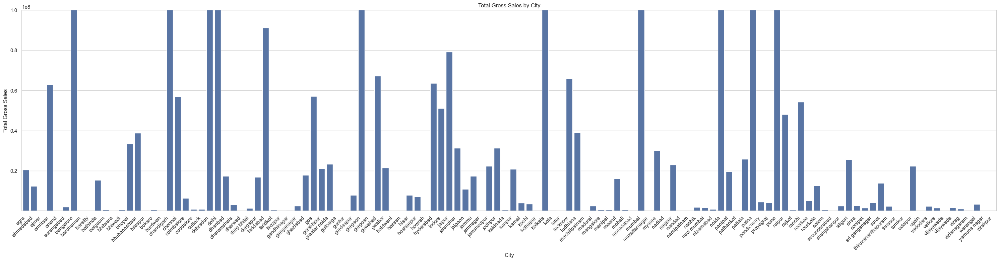

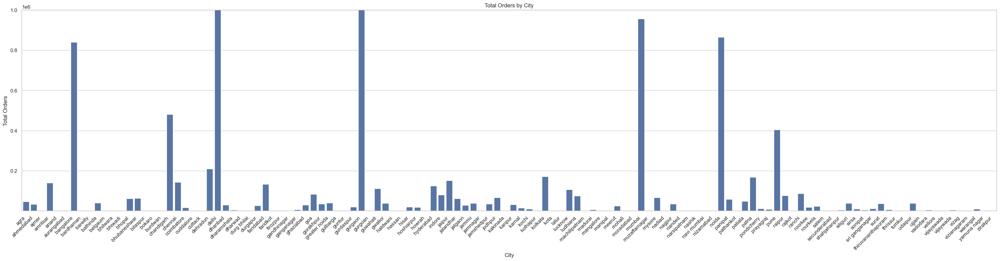

In [13]:
city_summary_df = final_display_df.groupby('city').agg(
    total_gross_sales=('total_gross_sales', 'sum'),
    total_orders=('total_orders', 'sum')
).reset_index()

# Set up the plot style
sns.set(style="whitegrid")

max_sales = city_summary_df['total_gross_sales'].max()
min_sales = city_summary_df['total_gross_sales'].min()

# Set the threshold for max sales
sales_threshold = 100000000 

# Set the upper limit for the y-axis to be the minimum of max_sales and sales_threshold
sales_y_upper_limit = min(max_sales + (max_sales * 0.01), sales_threshold)

# Plot Total Gross Sales by City
plt.figure(figsize=(30, 8))  # Increase figure size
sns.barplot(data=city_summary_df, x='city', y='total_gross_sales')
plt.title('Total Gross Sales by City')
plt.xlabel('City')
plt.ylabel('Total Gross Sales')

# Dynamically adjust the y-axis range based on the max and min sales values
plt.ylim(min_sales - (min_sales * 0.01), sales_y_upper_limit)  # Adjust y-axis range

plt.xticks(rotation=45, ha='right')  # Rotate city names and align them to the right
plt.tight_layout()  # Adjust layout to avoid clipping
plt.subplots_adjust(bottom=0.2)  # Adjust space at the bottom for the x-axis labels
plt.show()

# Plot 2: Total Orders by City
# Calculate the maximum and minimum values for orders
max_orders = city_summary_df['total_orders'].max()
min_orders = city_summary_df['total_orders'].min()

# Set the threshold for max orders
threshold = 1000000  # Set a threshold for the y-axis maximum value

# Set the upper limit for the y-axis to be the minimum of max_orders and threshold
y_upper_limit = min(max_orders + (max_orders * 0.01), threshold)

# Plot Total Orders by City
plt.figure(figsize=(30, 8))  # Increase figure size
sns.barplot(data=city_summary_df, x='city', y='total_orders')
plt.title('Total Orders by City')
plt.xlabel('City')
plt.ylabel('Total Orders')

# Dynamically adjust the y-axis range based on the max and min orders values
plt.ylim(min_orders - (min_orders * 0.02), y_upper_limit)  # Adjust y-axis range

plt.xticks(rotation=45, ha='right')  # Rotate city names and align them to the right
plt.tight_layout()  # Adjust layout to avoid clipping
plt.subplots_adjust(bottom=0.2)  # Adjust space at the bottom for the x-axis labels
plt.show()  # Display the plot



RESULTS 

In [14]:
df = pd.DataFrame(sales_display_df)

# Remove rows with null latitude or longitude
df = df.dropna(subset=['latitude', 'longitude'])

def auto_zone_score_pca(df, threshold_percentiles=(33, 66)):
    features = ['total_gross_sales', 'total_orders', 'avg_order_value', 'total_discount']
    scaler = MinMaxScaler()
    normalized = scaler.fit_transform(df[features])

    # PCA transformation
    pca = PCA(n_components=1)
    df['zone_score'] = pca.fit_transform(normalized)

    # Normalize zone_score between 0-1 (optional)
    df['zone_score'] = MinMaxScaler().fit_transform(df[['zone_score']])

    # Classification
    thresholds = np.percentile(df['zone_score'], threshold_percentiles)
    def classify_zone(score):
        if score <= thresholds[0]:
            return 'Low'
        elif score <= thresholds[1]:
            return 'Medium'
        else:
            return 'High'

    df['zone_classification'] = df['zone_score'].apply(classify_zone)
    df['zone_classification_numeric'] = df['zone_classification'].map({'Low': 0, 'Medium': 1, 'High': 2})
    
    return df.sort_values(by=['city', 'subzone']).reset_index(drop=True), thresholds

# Calculate zone score and thresholds
result_df, thresholds = auto_zone_score_pca(df)

# Display the results
pd.set_option('display.float_format', '{:.6f}'.format)
print("Thresholds for zone classification:", thresholds)
print(result_df[['city', 'subzone', 'zone_score', 'zone_classification']])


Thresholds for zone classification: [0.00362854 0.02766129]
                   city                          subzone  zone_score zone_classification
0                  Agra                  Bbk Agra Tier 2    0.000566                 Low
1                  Agra                      Civil Lines    0.035868                High
2                  Agra                        Lohamandi    0.002794                 Low
3                  Agra                          Tajganj    0.149788                High
4             Ahmedabad                        Bapunagar    0.001604                 Low
5             Ahmedabad                         Bodakdev    0.039915                High
6             Ahmedabad                       Chandkheda    0.009232              Medium
7             Ahmedabad                        Ghatlodia    0.011055              Medium
8             Ahmedabad                         Memnagar    0.000101                 Low
9             Ahmedabad                        Nar

In [15]:
result_df.head()

,city,subzone,total_gross_sales,total_orders,total_discount,avg_order_value,total_brands,latitude,longitude,zone_score,zone_classification,zone_classification_numeric
0,Agra,Bbk Agra Tier 2,50515.960000,107.000000,8386.560000,472.111776,1,27.175255,78.009816,0.000566,Low,0
1,Agra,Civil Lines,4456005.950000,7976.000000,988475.640000,558.676774,3,27.199435,78.005901,0.035868,High,2
2,Agra,Lohamandi,1078607.230000,335.000000,11310.640000,3219.723075,1,27.189606,77.994904,0.002794,Low,0
3,Agra,Tajganj,14996597.673300,38504.000000,3568753.730000,389.481552,11,27.168716,78.038968,0.149788,High,2
4,Ahmedabad,Bapunagar,146064.640000,385.000000,34927.570000,379.388675,2,23.032437,72.631357,0.001604,Low,0


In [16]:
import folium
import matplotlib.pyplot as plt

# Drop rows with missing coordinates
df = result_df.dropna(subset=['latitude', 'longitude'])

# Base map centered on India
map_center = [df['latitude'].mean(), df['longitude'].mean()]
zone_map = folium.Map(location=map_center, zoom_start=5)

# Color mapping for zone classification
zone_colors = {'Low': 'red', 'Medium': 'orange', 'High': 'green'}

# ---------- "All Cities" Feature Group ----------
all_cities_group = folium.FeatureGroup(name='All Cities', show=True)

for _, row in df.iterrows():
    zone = row['zone_classification']
    color = zone_colors.get(zone, 'blue')

    popup_text = f"""
        <b>City:</b> {row['city']}<br>
        <b>Subzone:</b> {row['subzone']}<br>
        <b>Zone:</b> {zone}<br>
        <b>Score:</b> {row['zone_score']:.2f}
    """

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=8,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(all_cities_group)

all_cities_group.add_to(zone_map)

# ---------- Individual City Feature Groups ----------
unique_cities = df['city'].unique()

for city in unique_cities:
    city_df = df[df['city'] == city]
    city_group = folium.FeatureGroup(name=city, show=False)

    for _, row in city_df.iterrows():
        zone = row['zone_classification']
        color = zone_colors.get(zone, 'blue')

        popup_text = f"""
            <b>City:</b> {row['city']}<br>
            <b>Subzone:</b> {row['subzone']}<br>
            <b>Zone:</b> {zone}<br>
            <b>Score:</b> {row['zone_score']:.2f}
        """

        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=8,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=folium.Popup(popup_text, max_width=300)
        ).add_to(city_group)

    city_group.add_to(zone_map)

# ---------- Legend ----------
legend_html = '''
<div style="position: fixed; bottom: 30px; left: 30px; width: 200px; height: 100px; background-color: white; 
border: 2px solid grey; z-index:9999; font-size:14px; padding: 10px;">
    <b>Zone Classification</b><br>
    <i style="background: red; width: 12px; height: 12px; display:inline-block; margin-right: 5px;"></i> Low<br>
    <i style="background: orange; width: 12px; height: 12px; display:inline-block; margin-right: 5px;"></i> Medium<br>
    <i style="background: green; width: 12px; height: 12px; display:inline-block; margin-right: 5px;"></i> High<br>
</div>
'''
zone_map.get_root().html.add_child(folium.Element(legend_html))

# Add layer control
folium.LayerControl(collapsed=False).add_to(zone_map)

zone_map


ANOMALY DETECTION 

In [17]:
from sklearn.ensemble import IsolationForest

# Define the features to check anomalies on
anomaly_features = ['total_gross_sales', 'total_orders', 'avg_order_value', 'total_discount']

# Normalize for better performance
scaler = MinMaxScaler()
X = scaler.fit_transform(result_df[anomaly_features])

# Fit Isolation Forest
iso = IsolationForest(contamination=0.05, random_state=42)  # Assume 5% of zones are anomalies
result_df['anomaly_score'] = iso.fit_predict(X)

# Label -1 as anomaly, 1 as normal
result_df['is_anomaly'] = result_df['anomaly_score'].map({-1: True, 1: False})


In [18]:
anomalies = result_df[result_df['is_anomaly']]
print("\nDetected Anomalous Subzones:\n")
print(anomalies[['city', 'subzone', 'total_gross_sales', 'total_orders', 'avg_order_value', 'total_discount', 'zone_score','zone_classification']])



Detected Anomalous Subzones:

           city                subzone  total_gross_sales  total_orders  avg_order_value  total_discount  zone_score zone_classification
2          Agra              Lohamandi     1078607.230000    335.000000      3219.723075    11310.640000    0.002794                 Low
90    Bangalore             Whitefield    55929452.156700  92225.000000       606.445673  9843447.860000    0.382870                High
128  Chandigarh              Panchkula    50389409.780000  95739.000000       526.320619  9184290.100000    0.378158                High
136  Chandigarh           South Mohali    60050288.660000 117550.000000       510.848904 11563451.320000    0.469572                High
165    Dehradun               Ballupur    43237166.910000  79326.000000       545.056689  7858340.610000    0.317999                High
173    Dehradun             Prem Nagar    27523662.530000  73497.000000       374.486884  6389950.930000    0.277946                High
213       

In [19]:
def classify_performance(row):
    # Overperforming Zone (high zone score, normal anomaly score)
    if row['zone_score'] >= thresholds[1] and row['is_anomaly'] == False:
        return 'Overperforming'
    
    # Underperforming Zone (low zone score, anomaly detected)
    elif row['zone_score'] <= thresholds[0] and row['is_anomaly'] == True:
        return 'Underperforming'
    
    # Inconsistent Zone (if anomaly is detected but no extreme score)
    elif row['is_anomaly'] == True:
        return 'Inconsistent'

    # If none of the above, we don't classify it (ignoring normal zones)
    return None

result_df['zone_performance'] = result_df.apply(classify_performance, axis=1)

# Filter out None (normal zones) and display the results
performance_df = result_df.dropna(subset=['zone_performance'])

# Filter for underperforming and inconsistent zones
performance_df = result_df[result_df['zone_performance'].isin(['Underperforming', 'Inconsistent'])]

# Display the results
print(performance_df[['city', 'subzone','total_gross_sales','total_orders','total_discount','avg_order_value','zone_score', 'zone_classification', 'zone_performance']])



           city                subzone  total_gross_sales  total_orders  total_discount  avg_order_value  zone_score zone_classification zone_performance
2          Agra              Lohamandi     1078607.230000    335.000000    11310.640000      3219.723075    0.002794                 Low  Underperforming
90    Bangalore             Whitefield    55929452.156700  92225.000000  9843447.860000       606.445673    0.382870                High     Inconsistent
128  Chandigarh              Panchkula    50389409.780000  95739.000000  9184290.100000       526.320619    0.378158                High     Inconsistent
136  Chandigarh           South Mohali    60050288.660000 117550.000000 11563451.320000       510.848904    0.469572                High     Inconsistent
165    Dehradun               Ballupur    43237166.910000  79326.000000  7858340.610000       545.056689    0.317999                High     Inconsistent
173    Dehradun             Prem Nagar    27523662.530000  73497.000000  638

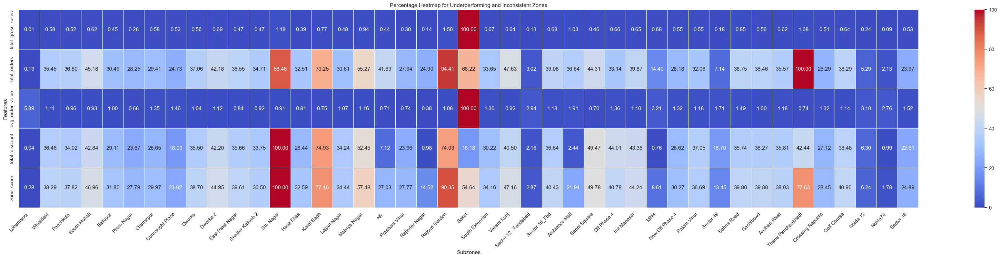

In [20]:
# Filter for underperforming and inconsistent zones
performance_df = result_df[result_df['zone_performance'].isin(['Underperforming', 'Inconsistent'])]

# Select the features and subzone name
heatmap_data = performance_df[['subzone', 'total_gross_sales', 'total_orders', 'avg_order_value', 'total_discount', 'zone_score']]

# Normalize the values to percentage (relative to the max value of each feature)
heatmap_data_percentage = heatmap_data.set_index('subzone').apply(lambda x: (x / x.max()) * 100, axis=0)

# Plot the heatmap with percentage values
plt.figure(figsize=(45, 8))
sns.heatmap(heatmap_data_percentage.T, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, vmin=0, vmax=100)
plt.title('Percentage Heatmap for Underperforming and Inconsistent Zones')
plt.ylabel('Features')
plt.xlabel('Subzones')
plt.xticks(rotation=45, ha='right')
plt.show()


TIME SLOT - SUBZONE WISE 

In [21]:
query = """ -- RISTA
SELECT 
    r.city,
    r.subzone,
    CASE
        WHEN EXTRACT(HOUR FROM rr.invoice_date) BETWEEN 5 AND 10 THEN 'Breakfast'
        WHEN EXTRACT(HOUR FROM rr.invoice_date) BETWEEN 11 AND 15 THEN 'Lunch'
        WHEN EXTRACT(HOUR FROM rr.invoice_date) BETWEEN 16 AND 19 THEN 'Snacks'
        WHEN EXTRACT(HOUR FROM rr.invoice_date) BETWEEN 20 AND 22 THEN 'Dinner'
        ELSE 'Other'
    END AS time_slot,
    SUM(rr.gross_amount + rr.direct_charge_amount + rr.other_charge_amount + rr.tip) AS total_gross_sales,
    COUNT(DISTINCT rr.uniq_id) AS total_orders,
    SUM(rr.discounts) AS total_discount,
    ROUND(SUM(rr.gross_amount + rr.direct_charge_amount + rr.other_charge_amount + rr.tip) / NULLIF(COUNT(DISTINCT rr.uniq_id), 0), 2) AS avg_order_value
FROM 
    region r
JOIN master_ids m ON r.region_id = m.region_id
JOIN brand b ON m.brand_id = b.brand_id
JOIN sales_transaction_audit_report_rista rr ON m.pos_id = rr.pos_id
WHERE rr.sale_status = 'closed'
AND b.brand_name != 'not_partner'
GROUP BY r.city, r.subzone, time_slot

UNION ALL

-- PETPOOJA
SELECT 
    r.city,
    r.subzone,
    CASE
        WHEN EXTRACT(HOUR FROM p.date) BETWEEN 5 AND 10 THEN 'Breakfast'
        WHEN EXTRACT(HOUR FROM p.date) BETWEEN 11 AND 15 THEN 'Lunch'
        WHEN EXTRACT(HOUR FROM p.date) BETWEEN 16 AND 19 THEN 'Snacks'
        WHEN EXTRACT(HOUR FROM p.date) BETWEEN 20 AND 22 THEN 'Dinner'
        ELSE 'Other'
    END AS time_slot,
    SUM(p.my_amount + p.delivery_charge + p.container_charge + p.service_charge + p.additional_charge) AS gross_sales,
    COUNT(DISTINCT p.uniq_id) AS order_count,
    SUM(p.discount) AS total_discount,
    ROUND(SUM(p.my_amount + p.delivery_charge + p.container_charge + p.service_charge + p.additional_charge) / NULLIF(COUNT(DISTINCT p.uniq_id), 0), 2) AS avg_order_value
FROM 
    region r
JOIN master_ids m ON r.region_id = m.region_id
JOIN brand b ON m.brand_id = b.brand_id
JOIN order_summary_report_petpooja p ON m.pos_id = p.pos_id
WHERE p.status = 'Success'
AND b.brand_name != 'not_partner'
GROUP BY r.city, r.subzone, time_slot

UNION ALL

-- ZOMATO
SELECT 
    r.city,
    r.subzone,
    CASE
        WHEN EXTRACT(HOUR FROM z.order_placed_at) BETWEEN 5 AND 10 THEN 'Breakfast'
        WHEN EXTRACT(HOUR FROM z.order_placed_at) BETWEEN 11 AND 15 THEN 'Lunch'
        WHEN EXTRACT(HOUR FROM z.order_placed_at) BETWEEN 16 AND 19 THEN 'Snacks'
        WHEN EXTRACT(HOUR FROM z.order_placed_at) BETWEEN 20 AND 22 THEN 'Dinner'
        ELSE 'Other'
    END AS time_slot,
    SUM(z.bill_subtotal + z.packaging_charges) AS gross_sales,
    COUNT(DISTINCT z.order_id) AS total_orders,
    SUM(
            z.restaurant_discount_promo +
            z.restaurant_discount_flat_offs_freebies_others +
            z.gold_discount +
            z.brand_pack_discount
        ) AS total_discount,
    ROUND(SUM(z.bill_subtotal + z.packaging_charges)  / NULLIF(COUNT(DISTINCT z.order_id), 0), 2) AS avg_order_value
FROM 
    region r
JOIN master_ids m ON r.region_id = m.region_id
JOIN brand b ON m.brand_id = b.brand_id
JOIN rating_zomato z ON m.res_id = z.restaurant_id
WHERE z.order_status = 'Delivered'
AND b.brand_name != 'not_partner'
GROUP BY r.city, r.subzone, time_slot

UNION ALL

-- SWIGGY
SELECT 
    r.city,
    r.subzone,
    CASE
        WHEN EXTRACT(HOUR FROM s.ordered_time) BETWEEN 5 AND 10 THEN 'Breakfast'
        WHEN EXTRACT(HOUR FROM s.ordered_time) BETWEEN 11 AND 15 THEN 'Lunch'
        WHEN EXTRACT(HOUR FROM s.ordered_time) BETWEEN 16 AND 19 THEN 'Snacks'
        WHEN EXTRACT(HOUR FROM s.ordered_time) BETWEEN 20 AND 22 THEN 'Dinner'
        ELSE 'Other'
    END AS time_slot,
    SUM(s.gmv + s.packing_charge) AS total_gross_sales,
    COUNT(DISTINCT s.order_id) AS total_orders,
    SUM(s.coupon_discount) AS total_discount,
    ROUND(SUM(s.gmv + s.packing_charge) / NULLIF(COUNT(DISTINCT s.order_id), 0), 2) AS avg_order_value
FROM 
    region r
JOIN master_ids m ON r.region_id = m.region_id
JOIN brand b ON m.brand_id = b.brand_id
JOIN swiggy_order_detail_v2 s ON m.res_id = s.res_id
WHERE s.post_status = 'Completed'
AND b.brand_name != 'not_partner'
GROUP BY r.city, r.subzone, time_slot

UNION ALL

-- URBAN PIPER
SELECT 
    r.city,
    r.subzone,
    CASE
        WHEN EXTRACT(HOUR FROM u.invoice_date) BETWEEN 5 AND 10 THEN 'Breakfast'
        WHEN EXTRACT(HOUR FROM u.invoice_date) BETWEEN 11 AND 15 THEN 'Lunch'
        WHEN EXTRACT(HOUR FROM u.invoice_date) BETWEEN 16 AND 19 THEN 'Snacks'
        WHEN EXTRACT(HOUR FROM u.invoice_date) BETWEEN 20 AND 22 THEN 'Dinner'
        ELSE 'Late Night'
    END AS time_slot,
    SUM(u.gross_amount + u.other_charge_amount) AS total_gross_sales,
    COUNT(DISTINCT u.uniq_id) AS total_orders,
    SUM(u.discount) AS total_discount,
    ROUND(SUM(u.gross_amount + u.other_charge_amount) / NULLIF(COUNT(DISTINCT u.uniq_id), 0), 2) AS avg_order_value
FROM 
    region r
JOIN master_ids m ON r.region_id = m.region_id
JOIN brand b ON m.brand_id = b.brand_id
JOIN urban_piper_sales u ON m.pos_id = u.pos_id
WHERE u.sale_status = 'closed'
AND b.brand_name != 'not_partner'
GROUP BY r.city, r.subzone, time_slot;
"""

time_slot_df = pd.read_sql(query,conn)
time_slot_df

C:\Users\rijul\AppData\Local\Temp\ipykernel_14968\1174439414.py:135: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  time_slot_df = pd.read_sql(query,conn)


,city,subzone,time_slot,total_gross_sales,total_orders,total_discount,avg_order_value
0,Agra,Tajganj,Dinner,1867300.710000,2001,44602.400000,933.180000
1,Agra,Tajganj,Lunch,897316.250000,778,15185.940000,1153.360000
2,Agra,Tajganj,Other,295206.090000,209,12583.030000,1412.470000
3,Agra,Tajganj,Snacks,1054075.710000,1111,19966.870000,948.760000
4,Bangalore,Koramangala 5th Block,Breakfast,126771.000000,260,9607.930000,487.580000
5,Bangalore,Koramangala 5th Block,Dinner,2014961.000000,3027,42291.650000,665.660000
6,Bangalore,Koramangala 5th Block,Lunch,2435011.000000,3563,68605.030000,683.420000
7,Bangalore,Koramangala 5th Block,Other,588327.000000,950,14791.730000,619.290000
8,Bangalore,Koramangala 5th Block,Snacks,2548732.000000,4280,52838.020000,595.500000
9,Bhiwadi,Central Bhiwadi,Dinner,285213.630000,405,25561.450000,704.230000


In [22]:
peak_slots = (
    time_slot_df.sort_values("total_orders", ascending=False)
    .groupby(["city", "subzone"])
    .first()
    .reset_index()
)


In [23]:
time_slot_df["subzone_total_orders"] = time_slot_df.groupby(["city", "subzone"])["total_orders"].transform("sum")


In [24]:
time_slot_df["order_share_pct"] = (
    (time_slot_df["total_orders"] / time_slot_df["subzone_total_orders"]) * 100
).round(2)


In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Pivot table: subzones as rows, time slots as columns
slot_pivot = time_slot_df.pivot_table(
    index="subzone",
    columns="time_slot",
    values="total_orders",
    aggfunc="sum",
    fill_value=0
)

# Step 2: Normalize each time slot (column) so that it sums to 100%
slot_share_by_subzone = slot_pivot.div(slot_pivot.sum(axis=0), axis=1) * 100

# Optional: sort subzones by total across all time slots
subzone_total = slot_pivot.sum(axis=1)
slot_share_by_subzone = slot_share_by_subzone.loc[subzone_total.sort_values(ascending=False).index]

# Step 3: Plot the heatmap
plt.figure(figsize=(20, max(8, 0.4 * len(slot_share_by_subzone))))  # dynamic height
sns.heatmap(
    slot_share_by_subzone,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu",
    cbar_kws={"label": "% of Orders in Time Slot"},
    linewidths=0.3,
    linecolor="gray",
    annot_kws={"size": 6}
)

plt.title("Heatmap of Subzone Share (%) per Time Slot", fontsize=16)
plt.xlabel("Time Slot")
plt.ylabel("Subzone")
plt.xticks(rotation=45)
plt.yticks(rotation=0, fontsize=6)
plt.tight_layout()
plt.show()


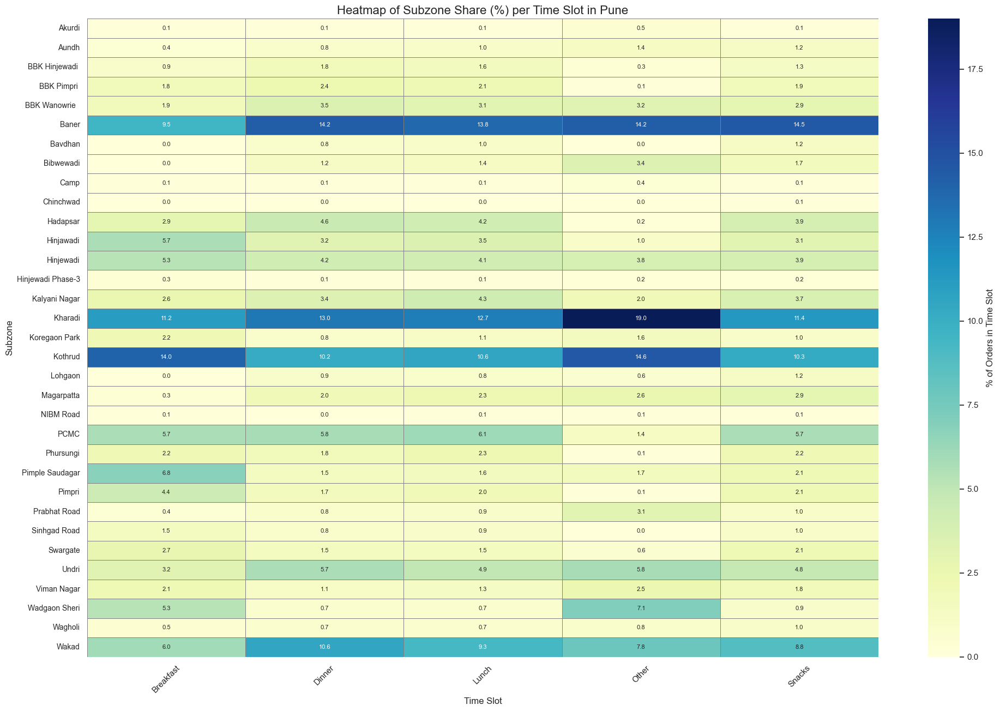

In [26]:
# Optimized Function to update plot
def plot_city_heatmap_optimized(city_name, time_slot_df):
    city_df = time_slot_df[time_slot_df["city"].str.lower() == city_name.lower()]

    if city_df.empty:
        print(f"No data found for city: {city_name}")
        return

    # Pivot table
    slot_pivot = city_df.pivot_table(
        index="subzone",
        columns="time_slot",
        values="total_orders",
        aggfunc="sum",
        fill_value=0
    )

    # Normalize with vectorized operation
    slot_share_by_subzone = (slot_pivot / slot_pivot.sum(axis=0)) * 100
    
    # # Sort by total orders (optional)
    # if top_n:
    #     subzone_total = slot_pivot.sum(axis=1)
    #     top_subzones = subzone_total.sort_values(ascending=False).head(top_n).index
    #     slot_share_by_subzone = slot_share_by_subzone.loc[top_subzones]
    
    # Limit to 1 decimal place without rounding during calculation
    slot_share_by_subzone = np.round(slot_share_by_subzone, 1)

    # Plot the heatmap
    plt.figure(figsize=(20, min(15, 0.4 * len(slot_share_by_subzone))))
    sns.heatmap(
        slot_share_by_subzone,
        annot=True,
        fmt=".1f",
        cmap="YlGnBu",
        cbar_kws={"label": "% of Orders in Time Slot"},
        linewidths=0.5,
        linecolor="gray",
        annot_kws={"size": 8}  # Smaller text for better performance
    )
    plt.title(f"Heatmap of Subzone Share (%) per Time Slot in {city_name}", fontsize=16)
    plt.xlabel("Time Slot")
    plt.ylabel("Subzone")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show()

# Example to test (Top 50 subzones only for faster loading)
plot_city_heatmap_optimized('Pune', time_slot_df)

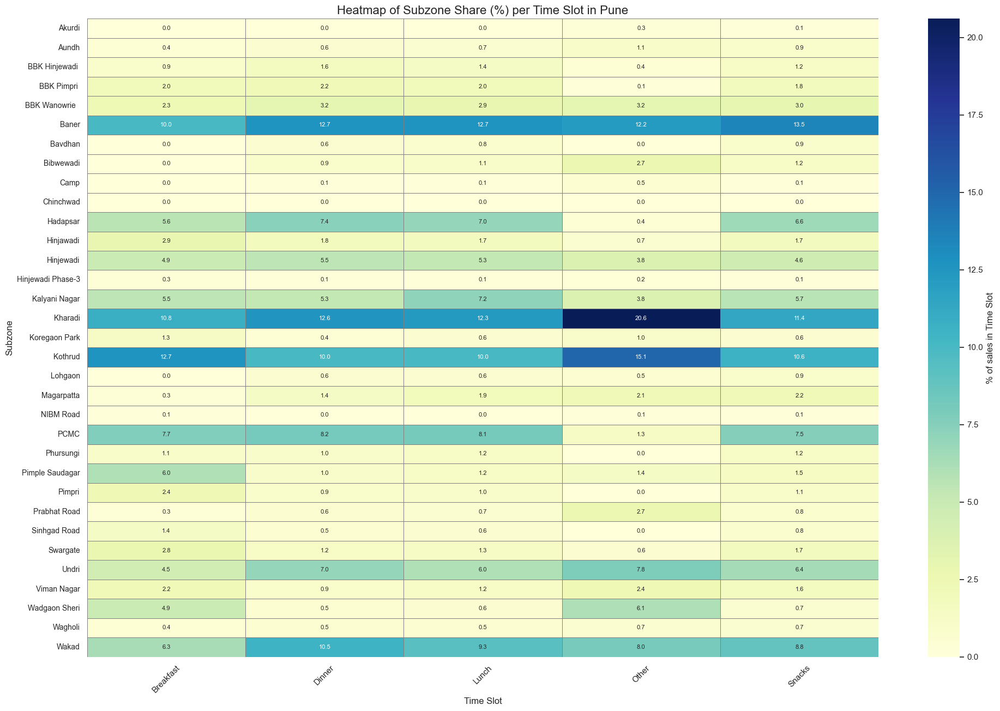

In [27]:
# Optimized Function to update plot
def plot_city_heatmap_optimized(city_name, time_slot_df, top_n=None):
    city_df = time_slot_df[time_slot_df["city"].str.lower() == city_name.lower()]

    if city_df.empty:
        print(f"No data found for city: {city_name}")
        return

    # Pivot table
    slot_pivot = city_df.pivot_table(
        index="subzone",
        columns="time_slot",
        values="total_gross_sales",
        aggfunc="sum",
        fill_value=0
    )

    # Normalize with vectorized operation
    slot_share_by_subzone = (slot_pivot / slot_pivot.sum(axis=0)) * 100
    
    # Sort by total orders (optional)
    if top_n:
        subzone_total = slot_pivot.sum(axis=1)
        top_subzones = subzone_total.sort_values(ascending=False).head(top_n).index
        slot_share_by_subzone = slot_share_by_subzone.loc[top_subzones]
    
    # Limit to 1 decimal place without rounding during calculation
    slot_share_by_subzone = np.round(slot_share_by_subzone, 1)

    # Plot the heatmap
    plt.figure(figsize=(20, min(15, 0.4 * len(slot_share_by_subzone))))
    sns.heatmap(
        slot_share_by_subzone,
        annot=True,
        fmt=".1f",
        cmap="YlGnBu",
        cbar_kws={"label": "% of sales in Time Slot"},
        linewidths=0.5,
        linecolor="gray",
        annot_kws={"size": 8}  # Smaller text for better performance
    )
    plt.title(f"Heatmap of Subzone Share (%) per Time Slot in {city_name}", fontsize=16)
    plt.xlabel("Time Slot")
    plt.ylabel("Subzone")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show()

# Example to test (Top 50 subzones only for faster loading)
plot_city_heatmap_optimized('Pune', time_slot_df)

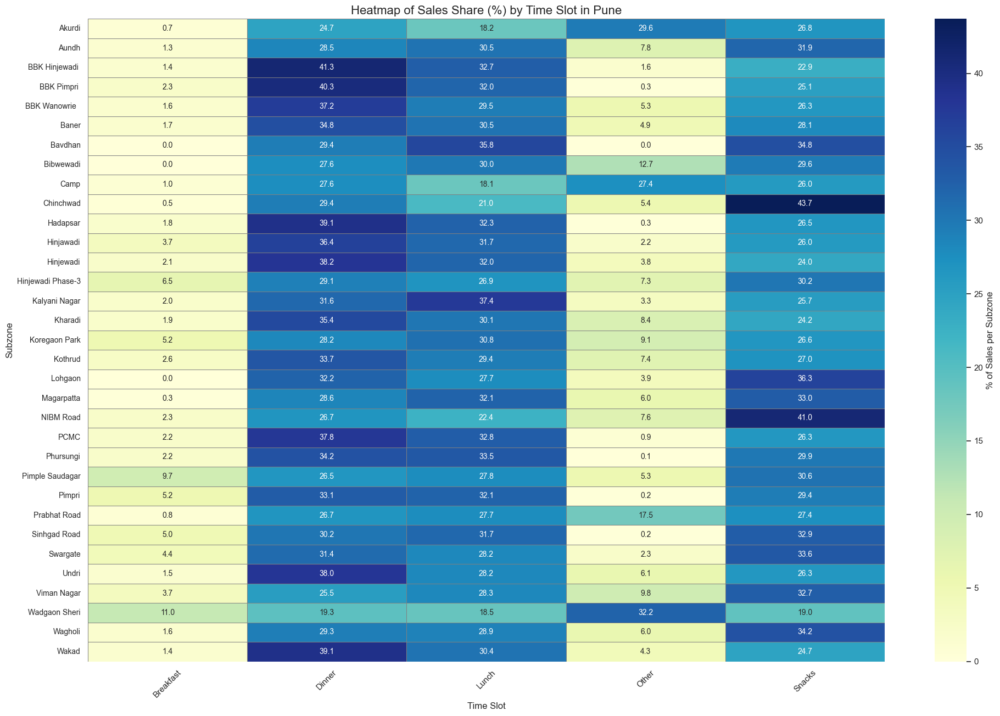

In [28]:
# Optimized Function to update plot
def plot_city_heatmap_optimized(city_name, time_slot_df, top_n=None):
    city_df = time_slot_df[time_slot_df["city"].str.lower() == city_name.lower()]

    if city_df.empty:
        print(f"No data found for city: {city_name}")
        return

    # Pivot table
    slot_pivot = city_df.pivot_table(
        index="subzone",
        columns="time_slot",
        values="total_gross_sales",
        aggfunc="sum",
        fill_value=0
    )

    # Normalize each row (subzone) to sum to 100%
    slot_share_by_subzone = (slot_pivot.T / slot_pivot.sum(axis=1)).T * 100

    # Sort by total sales (optional)
    if top_n:
        subzone_total = slot_pivot.sum(axis=1)
        top_subzones = subzone_total.sort_values(ascending=False).head(top_n).index
        slot_share_by_subzone = slot_share_by_subzone.loc[top_subzones]

    # Limit to 1 decimal place without rounding during calculation
    slot_share_by_subzone = np.round(slot_share_by_subzone, 1)

    # Plot the heatmap
    plt.figure(figsize=(20, min(15, 0.4 * len(slot_share_by_subzone))))
    sns.heatmap(
        slot_share_by_subzone,
        annot=True,
        fmt=".1f",
        cmap="YlGnBu",
        cbar_kws={"label": "% of Sales per Subzone"},
        linewidths=0.5,
        linecolor="gray",
        annot_kws={"size": 10}  # Smaller text for better performance
    )

    plt.title(f"Heatmap of Sales Share (%) by Time Slot in {city_name}", fontsize=16)
    plt.xlabel("Time Slot")
    plt.ylabel("Subzone")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0, fontsize=10)
    plt.tight_layout()
    plt.show()

# Example to test (Top 50 subzones only for faster loading)
plot_city_heatmap_optimized('Pune', time_slot_df)